<a href="https://colab.research.google.com/github/buwuyou/CTCN_2020_EE/blob/master/CTCN_notebook2_dadr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**This notebook demonstrates how to apply machine learning methods across a time-series of earth observation imagery and consequently to asses river and coastal morphology using linear regression.**

Upon completion you will be able to:


1.   Classify a time-series of monthly data.
2.   Create fractional water coverage.
3.   Calculate long-term linear regression.
4.   Interpret linear regression.
5.   Define 'at-risk' locations.
6.   Calculate short-term linear regression.
7.   Mitigate the impact of tides on coastal zones.
8.   Calculate linear regression on coastal zones.




Install the earth engine library and authenticate

In [0]:
!pip install -q earthengine-api

# Import the Earth Engine library.
import ee

# Trigger the authentication flow.
ee.Authenticate()
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://accounts.google.com/o/oauth2/auth?client_id=517222506229-vsmmajv00ul0bs7p89v5m89qs8eb9359.apps.googleusercontent.com&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fearthengine+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdevstorage.full_control&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&response_type=code&code_challenge=VOZOkprEmzcJNwr5KLQljRktRDOOok4hYLJZpZ4Pp7s&code_challenge_method=S256

The authorization workflow will generate a code, which you should paste in the box below. 
Enter verification code: 4/yQGR8832TKu4w_cin7ozbh2xRR2nXZUBnZa7TkwPyAEjSQDRlfRbS3Q

Successfully saved authorization token.


# 1.1 Use Folium to display an AOI

import libraries needed to visualise data in this notebook.

In [0]:
import folium
from pprint import pprint 
from folium import plugins
print(folium.__version__)

import pandas as pd
import matplotlib.pyplot as plt

plt.style.use("seaborn")

0.8.3


Add a number of basemaps that can be used for reference.

In [0]:
#  Add custom basemaps to folium
basemaps = {
    'Google Maps': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    ),
    'Google Satellite': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite',
        overlay = True,
        control = True
    ),
    'Google Terrain': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=p&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Terrain',
        overlay = True,
        control = True
    ),
    'Google Satellite Hybrid': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite',
        overlay = True,
        control = True
    ),
    'Esri Satellite': folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = True,
        control = True
    )
}

Define our area of interest

In [0]:
AOI = ee.Geometry.Polygon([[88.9, 23.2],[90.5, 23.2],[90.5, 24.7],[88.9, 24.7],[88.9, 23.2]])

Visualise it.

In [0]:
map = folium.Map(location=[24., 90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = True,
            control = True
        ).add_to(map)
map.add_child(folium.LayerControl())
map

# 1.2 Create a sentinel-2 image


1.   Make a function to mask clouds:  `ESAcloudMask(img)`.
2.   To calculate NDVI and NDWI indices:  `s2Indices(img)`.
3.   To create the sentinel-2 image: `getS2img(start, end, cloud, bounds)`




In [0]:
def ESAcloudMask(img):
    ''' Sentinel-2 Bits 10 & 11 are clouds & cirrus, so set to 0. '''
    qa = img.select('QA60')
    cloudBitMask = int(2**10)
    cirrusBitMask = int(2**11)
    clear = qa.bitwiseAnd(cloudBitMask).eq(0).And(\
           qa.bitwiseAnd(cirrusBitMask).eq(0))
    return img.updateMask(clear)

def s2Indices (img):
  ndvi = img.normalizedDifference(['B8', 'B4']).rename(['NDVI']); ##nir – red
  ndwi = img.normalizedDifference(['B8', 'B3']).rename(['NDWI']); ##nir – green
  return ee.Image([ndvi,ndwi])  

def getS2img (start, end, cloud, bounds):
  return (ee.ImageCollection('COPERNICUS/S2')
            .filterDate(start, end)
            .filterBounds(bounds)
            .filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', cloud)
            .map(ESAcloudMask)
            .map(s2Indices)
            .median()
            .clip(bounds))


Create an Sentinel-2 median composite using the functions above

In [0]:
startDate = ee.Date('2018-09-01')
endDate = ee.Date('2018-10-01')
cloudfilter = 30

s2 = getS2img(startDate, endDate, cloudfilter, AOI)

Visualise the composite for NDVI and NDWI. 

How do they differ? Zoom in and explore the map. 

In general they are very similar, however, NDVI was created for vegetation monitoring whereas NDWI was created for water monitoring.

Try also changing the dates and cloudfilter in the code block above. 

How does that impact upon the composites? Is there missing data due to clouds?

In [0]:
S2NDVIid = s2.getMapId({'bands': ['NDVI'], 'min': -1, 'max': 1, 'palette':['#d7191c','#fdae61','#ffffbf','#a6d96a','#1a9641']})
S2NDWIid = s2.getMapId({'bands': ['NDWI'], 'min': -1, 'max': 1, 'palette':['#018571','#80cdc1','#f5f5f5','#dfc27d','#a6611a']})

map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.TileLayer(
    tiles=S2NDVIid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S2 NDVI',
  ).add_to(map)

folium.TileLayer(
    tiles=S2NDWIid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S2 NDWI',
  ).add_to(map)


map.add_child(folium.LayerControl())
map

# 1.3 Create a sentinel-1 image

Sentinel-1 imagery does not require cloud masking. However, there are other pre-processing steps we should undertake before using it for analysis. GEE has already completed thermal noise removal, radiometric calibration and terrain correction.

In this function `s1Preprocessing (img) ` extreme angles are masked because the backscatter values are less consistent. We then want to average our values to create a composite. However, the GRD format is stored as decibel units, which is scaled logarithmically. You should not average logarithms (decibels) as they are not the true value, thus we apply a function to return to the raw values, take the average, and then convert back to decibels.

This function `getS1img (start, end, bounds)` uses the above preprocessing and creates a composite, returning the bands VV, VH and angle. We include the angle band because angle has an impact upon the backscatter signal. Including it in classifications could help a machine learning algorithm to account for this bias in the signal.

In [0]:


def s1Preprocessing (img):
  def db2raw (img):
    return ee.Image(10.0).pow(img.select(['VV', 'VH']).divide(10.0))
  def raw2db (img):
    return ee.Image(img).log10().multiply(10.0)
  def maskAngleGT30 (img):
    angle = img.select(['angle'])
    return img.updateMask(angle.gt(30))
  def maskAngleLT45 (img):
    angle = img.select(['angle'])
    return img.updateMask(angle.lt(45))
  
  maskedAngles = img.map(maskAngleGT30).map(maskAngleLT45)
  rawValues = maskedAngles.map(db2raw)
  average = rawValues.mean()
  dbValues = raw2db(average)

  angle = img.select('angle').mean()

  return dbValues.addBands(angle)


def getS1img (start, end, bounds):
  s1Collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
           .filterBounds(bounds)
           .filterDate(start, end)
           .filterMetadata('instrumentMode','equals', 'IW')
           .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
           .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')))
  
  return s1Preprocessing(s1Collection).clip(AOI)



Create the sentinel-1 composite

In [0]:
startDate = ee.Date('2018-09-01')
endDate = ee.Date('2018-11-01')

s1 = getS1img(startDate, endDate, AOI)


Visualise the composite for VV, VH and ANGLE, as well as a VV VH difference band.


How do they differ? Zoom in and explore the map. Look closely at urban areas and water bodies.


They are very similar but we do see some differences in urban areas and also water bodies. Thus, we will keep both as we are interested in water bodies and it appears that the two bands are adding different information.


Looking at the angle band, the geometric pattern is due to the different satellite overpasses. Can you see an impact of angle on the VV, VH bands? 


It doesn't appear to impact much on the backscatter values, but remember, we removed the most extreme angles in a preprocessing step. 


It is also very common to seperate ascending and descending orbits when using Sentinel-1 data because the satellites are 'right looking' and thus the backscatter values can vary substantially. However, this is most important in mountainous regions and so we haven't done that here.


In general it looks like Sentinel-1 is very capable of identifying water bodies and it isn't affected by cloud!


In [0]:
S1VVid = s1.getMapId({'bands': ['VV'], 'min': -20, 'max': 1})
S1VHid = s1.getMapId({'bands': ['VH'], 'min': -25, 'max': -5})

## calculate the difference
S1VVVHdiff = s1.select('VV').subtract(s1.select('VH')).rename('difference')
S1difID = S1VVVHdiff.getMapId({'min': 0, 'max': 15, 'palette': ['#fef0d9','#fdcc8a','#fc8d59','#e34a33','#b30000']})

## add the angle band
S1ANGLEid = s1.getMapId({'bands': ['angle'], 'min': 30, 'max': 45})


map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.TileLayer(
    tiles=S1ANGLEid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S1 angle',
  ).add_to(map)

folium.TileLayer(
    tiles=S1difID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S1 VV VH difference',
  ).add_to(map)


folium.TileLayer(
    tiles=S1VVid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S1 VV',
  ).add_to(map)

folium.TileLayer(
    tiles=S1VHid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='S1 VH',
  ).add_to(map)


map.add_child(folium.LayerControl())
map

# 1.4 Visualise JRC Global Surface Water monthly image

The JRC GSW layer is a peer reviewed data source of good quality in identifying water at 30m scale and monthly timesteps from 1984-2019. We will use this to teach a classifier what is water and what is land.

In [0]:
## This function gets the monthly water extent map from the images start date.
def getTraining(start, end):
    startYear = start.get('year')
    startMonth = start.get('month')

    training = ee.ImageCollection('JRC/GSW1_1/MonthlyHistory'
                                ).filterMetadata('year', 'equals', startYear
                                ).filterMetadata('month', 'equals', startMonth
                                ).first()
                                
    training = training.updateMask(training.neq(0)).subtract(1).rename('training')
    return training                         

startDate = ee.Date('2018-09-01')
endDate = ee.Date('2018-11-01')
training = getTraining(startDate, endDate)       

Visualise the layer. 

Note there are a number of NoData (transparent) pixels in addition to land (grey) and water (blue).

It is a very good data layer, however, it is not perfect. It is created from Landsat imagery and so is at 30m resolution. this means that it is unlikely to identify small and narrow water bodies.

In [0]:
trainingID = training.getMapId({'min':0, 'max': 1, 'palette':['gray', 'blue'], 'opacity': 0.5})


map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.TileLayer(
    tiles=trainingID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='JRC GSW training layer',
  ).add_to(map)

map.add_child(folium.LayerControl())
map

Now we have all the data we need to train a machine learning classifier that will create a 10m land-water product from Sentinel-1 and Sentinel-2 using the JRC as training.

# 2.1 Time-series analysis: Create samples

Let's create some samples that we cna use to teach our model what is water and what is land.

We will specify a daterange between 2017, when Sentinel-1 and Sentinel-2 A & B were fully operational, until the end of 2018, which is the latest date we have JRC training data for.

We chose a stepSize of 14 days, which will create 14 day composites and a cloudfilter value of <25%. These values where not chosen because they are the 'best', so don't be afraid to try this notebook again with different values.


In [0]:
endDate = ee.Date('2018-12-31')   ## The latest JRC SWE training data.
startDate = ee.Date('2017-01-01') ## start in 2017. The year that Sentinel-1 AND Sentinel-2 (A & B) become fully operational.
stepSize = 14            ## in days
cloudfilter = 25


Create a list between the start and end dates with the defined stepsize. 

In [0]:
### Make a list of days between the start and end date, in 14 day increments.
def getTrainingDateList (start, end, step):
  totalDays = end.difference(start, 'day')
  print(f'{totalDays.getInfo()} days between the start end date')
  dateList = ee.List.sequence(0, totalDays, step)

  def numbersToDates (number):
    startDate = start.advance(number, 'day')
    endDate = startDate.advance(step, 'day')
    return ee.Feature(None, {'dateNumber': number, 'system:time_start': startDate,
                             'system:time_end': endDate})

  return ee.FeatureCollection(dateList.map(numbersToDates))


dateList = getTrainingDateList(startDate, endDate, stepSize)

print('\n Inspect the first feature in the list: \n')
pprint(dateList.first().getInfo())


729 days between the start end date

 Inspect the first feature in the list: 

{'geometry': None,
 'id': '0',
 'properties': {'dateNumber': 0,
                'system:time_end': {'type': 'Date', 'value': 1484438400000},
                'system:time_start': {'type': 'Date', 'value': 1483228800000}},
 'type': 'Feature'}


Create a function so that for each date in our list we create a training image and sample it. 


1.   Get the start and end date and set a 'random' seed.
2.   Create the training image (Sentinel data + JRC)
3.   Identify some regions of interest to sample from.
4.   Sample each region.

The benefit of creating regions first and then sampling is to ensure our overall sample population is well distributed and it also appears to reduce processing times.



In [0]:
def getTrainingImg (start, end, cloud, bounds):
  training = getTraining(start, end)
  s1 = getS1img(start, end, bounds)
  s2 = getS2img(start, end, cloud, bounds)
  return training.addBands([s1, s2])

def getS1TrainingImg (start, end, bounds):
  training = getTraining(start, end)
  s1 = getS1img(start, end, bounds)
  return training.addBands([s1])

def getTrainingAOIs (img, seed, bounds):
  return img.stratifiedSample(
      numPoints=5, classBand='training', region=bounds, scale=500, 
      seed= seed, geometries= True) 

def getSamples (feature, img, seed):
  geometry = feature.geometry().buffer(2000).bounds() ##make a square 4km^2 geometry.
  return img.stratifiedSample(
      numPoints=30, classBand='training', region=geometry, scale=10, 
      seed=seed, geometries=True)


def getTrainingSamples (feature, bounds, onlyS1= False):
  start = ee.Date(feature.get('system:time_start'))
  end = ee.Date(feature.get('system:time_end'))
  seed = feature.get('dateNumber')

  ## create the training image.
  trainingImg = ee.Image(
      ee.Algorithms.If(
          condition= onlyS1, 
          trueCase= getS1TrainingImg(start, end, bounds), 
          falseCase= getTrainingImg(start, end, cloudfilter, bounds)))

  ## Get (10) AOIs sampled at 1000m scale.
  trainingAOIs = getTrainingAOIs(trainingImg, seed, bounds)
  
  ## Sample those AOIs at 10m scale. 
  trainingSamples = trainingAOIs.map(lambda aoi: getSamples(aoi, trainingImg, seed)).flatten() ## must flatten, otherwise a collection of collections.
  return trainingSamples



Map the function over the date list. This just means apply the function to every date at the same time. It is an efficient method that makes full advantage of cloud processing.



In [18]:
samples = dateList.map(lambda date: getTrainingSamples(date, AOI, onlyS1=False)).flatten()
pprint(samples.first().getInfo())


{'geometry': {'coordinates': [90.4511413791736, 23.38004765790093],
              'geodesic': False,
              'type': 'Point'},
 'id': '0_0_0',
 'properties': {'NDVI': 0.363501638174057,
                'NDWI': 0.2887938618659973,
                'VH': -12.761473696992514,
                'VV': -10.265444763015449,
                'angle': 34.90712356567383,
                'training': 0},
 'type': 'Feature'}



Now export the samples to a folder in your account. This stage is optional, you could compute these 'on the fly' as we progress through the notebook, however, since we are going to be using them every time we predict an image it is quicker to export them to asset.

Make sure to change the ***exportFolder*** name!

It will take around 5 minutes to export.

In [0]:
S1S2exportName = f'CTCN_samples_S2S1_{stepSize :2}_{cloudfilter:2}'
exportFolder = 'users/buwuyou/CTCN/'

### Export to asset
task= ee.batch.Export.table.toAsset(
            collection = samples,
            description = S1S2exportName,
            assetId = exportFolder + S1S2exportName)
task.start()


We will also export some Sentinel-1 only samples using the same function but changing the parameter `onlyS1` to `True`. 

We can use these when we do not have any available Sentinel-2 imagery.

In [20]:
samplesS1 = dateList.map(lambda date: getTrainingSamples(date, AOI, onlyS1=True)).flatten()
pprint(samplesS1.first().getInfo())

{'geometry': {'coordinates': [90.4511413791736, 23.38004765790093],
              'geodesic': False,
              'type': 'Point'},
 'id': '0_0_0',
 'properties': {'VH': -12.761473696992514,
                'VV': -10.265444763015449,
                'angle': 34.90712356567383,
                'training': 0},
 'type': 'Feature'}


Now export the samples to a folder in your account.

It will take around 5 minutes to export.

In [0]:
S1exportName = f'CTCN_samples_S1_{stepSize :2}'

### Export to asset
task= ee.batch.Export.table.toAsset(
            collection = samplesS1,
            description = S1exportName,
            assetId = exportFolder + S1exportName)
task.start()


Let's quickly check the samples exist and visualise them!

If you get an error message they may not have finished exporting. Wait a little longer.

In [25]:
s1s2Samples = ee.FeatureCollection(exportFolder + S1S2exportName)
s1Samples = ee.FeatureCollection(exportFolder + S1exportName)

print(f'Number of S1S2 samples: {s1s2Samples.size().getInfo()}')
print(f'Number of S1 only samples: {s1Samples.size().getInfo()}')


Number of S1S2 samples: 29856
Number of S1 only samples: 30075


We collected over 30,000 samples randomly distributed through time and space!

This sounds like a lot but machine learning methods often improve with the volume of samples (up to a saturation point). 

Furthermore, our samples should represent as many different values of water and land as possible so that we can accurately predict 'new' and 'unknown' pixels. If we only sampled from one date with for example, little wind, our classifier may not be very good at predicting on a windy day!

Visualise a small subset of the training data. We don't need to visualise all 30,000 of them!

In [26]:
## Randomly select 5% of the data to visualise.
s1s2SamplesViz = s1s2Samples.randomColumn().filterMetadata('random', 'less_than', 0.05)
s1SamplesViz = s1Samples.randomColumn().filterMetadata('random', 'less_than', 0.05)


map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)


## Add the AOI
folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = True,
            control = True
        ).add_to(map)


style_function = lambda feature: {'color': 'blue' if feature['properties']['training'] == 1 else 'red',
                                   'fillOpacity': 0.1}


## we buffer the samples to make it more obvious.
folium.GeoJson(
            data = s1s2SamplesViz.map(lambda f: f.buffer(50).bounds()).getInfo(),
            name = 'S1S2 Samples',
            overlay = True,
            control = True,
            style_function=style_function,
        ).add_to(map)


folium.GeoJson(
            data = s1SamplesViz.map(lambda f: f.buffer(50).bounds()).getInfo(),
            name = 'S1 only Samples',
            overlay = True,
            control = True,
            style_function=style_function,
        ).add_to(map)

map.add_child(folium.LayerControl())
map

You can see that our samples (both water and land) are heavily clustered around the river. That's good, our classifier should then be able to distinguish between the two in this important area!

We can also look at the distribution of our data.

Remember! 
 training group 0 is land and group 1 is water 



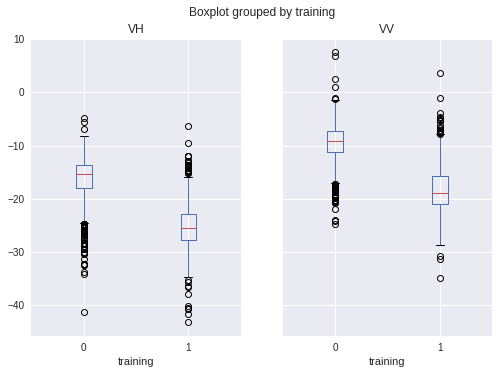

It looks like water (class 1) has lower values in both sentinel-1 indices 



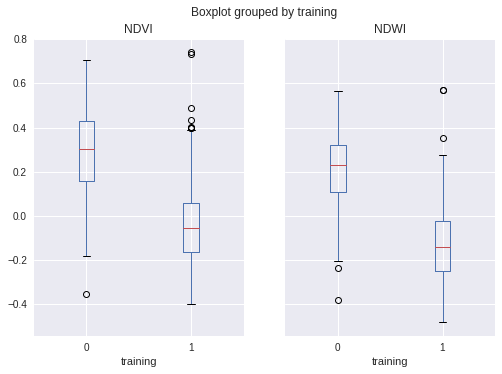

It looks like water (class 1) has lower values in both sentinel-2 indices


In [28]:
data = s1s2SamplesViz.getInfo()['features']

property_list = [{**feat['properties']} for feat in data]

df = pd.DataFrame(property_list)

print('Remember! \n training group 0 is land and group 1 is water \n')

s1columns = ['VH', 'VV']
ax = df.boxplot(column= s1columns, by='training')
plt.show()
print('It looks like water (class 1) has lower values in both sentinel-1 indices \n')

s2columns = ['NDVI', 'NDWI']
ax = df.boxplot(column= s2columns, by='training')
plt.show()
print('It looks like water (class 1) has lower values in both sentinel-2 indices')


# 2.2 Time-series analysis: Create a machine learning model

Instantiate a basic random forest classifier with output mode set to probability.

There are many great resources to help you understand random forests. In summary, they are a collection of decision trees (e.g. is water blue?) that ask different questions and use different data to decide what class a pixel is. Once all the data has passed through the model, a set of questions has been created which can be applied to new and unknown data. The method is widely known to be robust and requires few parameters to be tuned, typically the most important is the number of 'trees' in the 'forest'. We set this to 50. 

In [0]:
## we will use the same classifier for both models: A random forest with 50 tress.
RFclassifier = ee.Classifier.smileRandomForest(numberOfTrees= 50, minLeafPopulation= 5)
     
## Set the output to probability
RFclassifier = RFclassifier.setOutputMode('PROBABILITY')


Train a model using Sentinel-2 and Sentinel-1 data and assess its performance.

Make sure that the samples do not contain any null values, this could occur if the sentinel-2 data is missing, but we have sentinel-1 data.

We use 'Out of bag error' metrics to asses the performance. It uses a sub sample of the trianing data to asses the performance. It is important to remember that this is not fully independent, however, it gives a good indication and is easy to implement.

Variable importance is the extent to which the variable helps the classifier predict the data. It is a relative measure, with higher values indicating greater importance.

The outOfBagErrorEstimate is 0.086. This means our classifer is wrong 8.6 % of the time 



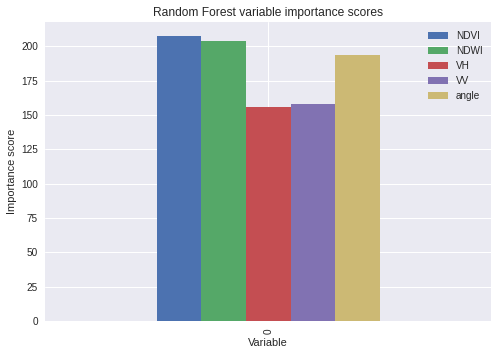

In [30]:
## first ensure the samples have values for every single feature.
## There may be some features that have only S1 data (for example if s2 was missing).
s1s2Samples = s1s2Samples.filter(ee.Filter.notNull(['VH', 'VV', 'angle', 'NDVI', 'NDWI']))


## Now make two models using different training data.
RFmodelS1S2 = RFclassifier.train(
                   features= s1s2Samples, 
                   classProperty= 'training',
                   inputProperties= ['VH', 'VV', 'angle', 'NDVI', 'NDWI'],
                   )


## What did our classifier learn?
S1S2_meta = RFmodelS1S2.explain()

## Two of the more useful metrics are the importance and outOfBagErrorEstimate
S1S2_OOB = round(S1S2_meta.get('outOfBagErrorEstimate').getInfo(), 3)
print(f'The outOfBagErrorEstimate is {S1S2_OOB}. This means our classifer is wrong {S1S2_OOB*100} % of the time \n')

importance =  S1S2_meta.get('importance').getInfo()

def plotImportance (importance):
  df = pd.Series(importance).to_frame().transpose()
  ax = df.plot(kind='bar',title='Random Forest variable importance scores', grid= True)
  ax.set_xlabel("Variable")
  ax.set_ylabel("Importance score")

plotImportance(importance)

## you can also view the tree schematics and work out how 
## the model decides wether a pixel is land or water
trees = S1S2_meta.get('importance')
# pprint(trees)

Train a model using Sentinel-1 only and assess it's performance.

Also consider it's performance relative to Sentinel-2 + Sentinel-1. Which classifier would you expect to be more accurate?


The outOfBagErrorEstimate is 0.124. This means our classifer is wrong 12.4 % of the time 



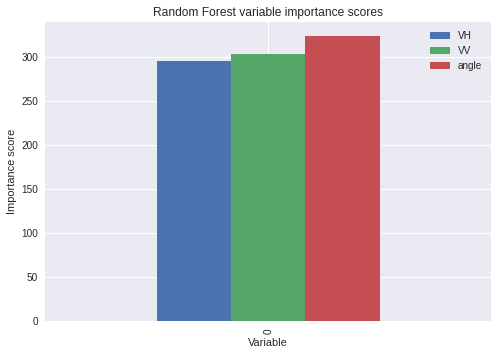

In [31]:
RFmodelS1 = RFclassifier.train(features= s1Samples, 
                   inputProperties= (['VH', 'VV', 'angle']),
                   classProperty= 'training')


## What did our classifier learn?
S1_meta = RFmodelS1.explain();

## Two of the more useful metrics are the importance and outOfBagErrorEstimate
S1_OOB = round(S1_meta.get('outOfBagErrorEstimate').getInfo(), 3)
print(f'The outOfBagErrorEstimate is {S1_OOB}. This means our classifer is wrong {S1_OOB*100} % of the time \n')

importance =  S1_meta.get('importance').getInfo()
plotImportance(importance)

## you can also view the tree schematics and work out how 
## the model decides wether a pixel is land or water
trees = S1_meta.get('importance')
# pprint(trees)


Despite us not noticing any difference in the sentinel-1 imagery due to angle, our classifier finds it an important variable.

Further, comparing these results to the Sentinel-2 + Sentinel-1 classifier, we can see that the accuracy rate is lower. This is as expected and thus we should prioritise using both sensors when the data is available.

# 2.3 Time-series analysis: Predict all images.

The models have been trained and can now be applied to imagery. Set new global variables since we are not restricted by our training imagery. Ensure that the stepsize and cloud score is the same as our samples.

In [0]:
endDate = ee.Date('2020-03-01')
startDate = ee.Date('2017-01-01') ## start in 2017. The year that Sentinel-1 AND Sentinel-2 (A & B) become fully operational.
stepSize = 14            ## keep the stepsize the same as during sampling.
cloudfilter = 25


Create a list of dates between the start and end date in n day increments. At each date check how much Sentinel-1 and Sentinel-2 data exists. Once created, filter it so that there is at least 1 sentinel-1 image at every date.

In [33]:
### Make a list of days between the start and end date, in 14 day increments.
def getDateList (start, end, step, bounds, cloud):
  totalDays = end.difference(start, 'day')
  dateList = ee.List.sequence(0, totalDays, step)

  def getS1Size (start, end, bounds):
    s1Collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
            .filterBounds(bounds)
            .filterDate(start, end)
            .filterMetadata('instrumentMode','equals', 'IW')
            .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
            .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')))
    return s1Collection.size()
  
  def getS2Size (start, end, cloud, bounds):
    s2Collection = (ee.ImageCollection('COPERNICUS/S2')
                      .filterDate(start, end)
                      .filterBounds(bounds)
                      .filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', cloud))
    return s2Collection.size()

  def numbersToDates (number):
    startDate = start.advance(number, 'day')
    endDate = startDate.advance(step, 'day')
    
    s1Size = getS1Size(startDate, endDate, bounds)
    s2Size = getS2Size(startDate, endDate, cloudfilter, bounds)
    
    return ee.Feature(None, {'dateNumber': number, 'system:time_start': startDate,
                             'system:time_end': endDate, 's1Size': s1Size, 
                             's2Size': s2Size})

  return ee.FeatureCollection(dateList.map(numbersToDates))


predictionList = getDateList(startDate, endDate, stepSize, AOI, cloudfilter)
print(f'There are a total of {predictionList.size().getInfo()} images to predict before filtering')


There are a total of 83 images to predict before filtering


We should make sure there is at least sentinel-1 imagery at every date in our time-series.

In [34]:
s1List = predictionList.filterMetadata('s1Size', 'greater_than', 0)
print(f'There is now a total of {s1List.size().getInfo()} images to predict')


There is now a total of 83 images to predict


We are fine to continue, but it was worth making sure, otherwise our pipeline will break if there is no imagery!

Using the list populate the imagery with land-water predictions.

We prioritise using the combined approach when there is available imagery, otherwise we use sentinel-1 only.

In [0]:
def predictS1S2 (start, end, cloud, AOI):
  s1 = getS1img(start, end, AOI)
  s2 = getS2img(start, end, cloud, AOI)
  s1s2pred = ee.Image([s1, s2]).classify(RFmodelS1S2)
  return ee.ImageCollection([s1s2pred, s1.classify(RFmodelS1)]).reduce(ee.Reducer.firstNonNull())

def predictS1 (startDate, endDate, AOI):
   return ee.Image(getS1img(startDate, endDate, AOI)).classify(RFmodelS1)

def predictImgs (feature):
  ''' If there is S2 data:
          -- predict S2 + S1 (and fill the clouds with S1),
          -- else predict S1 only. '''

  startDate = ee.Date(feature.get('system:time_start'))
  endDate = ee.Date(feature.get('system:time_end'))
  s2Availability = ee.Number(feature.get('s2Size'))

  prediction = ee.Algorithms.If(condition= s2Availability.gt(0),
                                trueCase= predictS1S2(startDate, endDate, 
                                                      cloudfilter, AOI),
                                falseCase= predictS1(startDate, endDate, AOI))
  
  return ee.Image(prediction).multiply(100).toByte().rename('probability'
                  ).copyProperties(feature).set('system:time_start', startDate.millis())

## an imageCollection of predictions (0-100%) 
s1s2Predictions = ee.ImageCollection(s1List.map(predictImgs))


# 2.4 Time-series analysis: Visualise the predictions using Fractional Water Coverage (FWC)

Visualising a time-series of predictions can be difficult. One good method is to create a Fractional Water Coverage (FWC) map. These maps show how often a pixel is identified as water. For example if the pixel has a value of 30, that means that 30 out of 100 times that pixel is water. This suggests it is not permanent water but more likely to be an area of seasonal inundation.



In [0]:

threshold = 50
s1s2BinaryPreds = s1s2Predictions.map(lambda img: img.gt(threshold).copyProperties(img))

## count the number of water observations
countWater = s1s2BinaryPreds.sum().rename('FWC')
countTotal = s1s2BinaryPreds.count().rename('FWC')
fwc = countWater.divide(countTotal).multiply(100)


Visualise the results. They may be slow to load as we are processing a lot of data now!

In [0]:
fwcID = fwc.getMapId({'min':0, 'max': 100, 'palette':['#eff3ff','#bdd7e7','#6baed6','#3182bd','#08519c'], 'opacity': 0.9})

map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = AOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.TileLayer(
    tiles=fwcID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Fractional water coverage',
  ).add_to(map)

map.add_child(folium.LayerControl())
map

Export the results so that we can view them more quickly next time. 

It will take ~3-4 hours to export. This sounds like a long time, but imagine processing this locally?! We're analysing 3 years of all available Sentinel-1 and Sentinel-2 imagery!!

In [0]:
FWCexportName = 'CTCN_FWC'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= fwc,
            region= AOI,
            scale= 10,
            maxPixels= 10e12,
            description = FWCexportName,
            assetId = exportFolder + FWCexportName)
task.start()


If it is taking too long to load, use this asset we have already computed and then run the visualisation cell above again.

You can change this to your own asset once it's finished exporting.


In [0]:
fwc = ee.Image('users/geo4gras/CTCN/CTCN_FWC')

# 2.5 Time series analysis: Long-term regression

Another method we could apply to a time-series of information is linear regression. 

Linear regression can identify areas that are becoming wetter or drier and could be useful in identifying 'at risk' locations. It assumes that the data follows a linear trend which may not be entirely true for water dynamics as we know that there are wet and dry seasons. Nevertheless,  these non-linear variations may average out over time, especially as we collate more information, so it remains a useful method of analysis. 

First, we must add a time band (the independent variable) to our predictions.

In [0]:
### long term-linear regression

def createTimeBand (img):
  index = ee.Image(ee.Number(img.get('dateNumber'))).rename('time').float()
  return img.addBands(index).copyProperties(img)

linearData = s1s2Predictions.map(createTimeBand)

pprint(linearData.first().getInfo())


{'bands': [{'crs': 'EPSG:4326',
            'crs_transform': [1, 0, 0, 0, 1, 0],
            'data_type': {'max': 255,
                          'min': 0,
                          'precision': 'int',
                          'type': 'PixelType'},
            'id': 'probability'},
           {'crs': 'EPSG:4326',
            'crs_transform': [1, 0, 0, 0, 1, 0],
            'data_type': {'precision': 'float', 'type': 'PixelType'},
            'id': 'time'}],
 'properties': {'dateNumber': 0,
                's1Size': 4,
                's2Size': 9,
                'system:index': '0',
                'system:time_start': 1483228800000},
 'type': 'Image'}


Now we have an imageCollection where each image has two bands; the independent (time) and the dependent (water probability). We can apply the linearFit reducer to this.

In [0]:

## Reduce the collection with the linear fit reducer (Independent variable are followed by dependent variables).
linearFit = linearData.select(['time', 'probability']).reduce(ee.Reducer.linearFit())


Let's visualise the results. 

Visualisation is important in convincing stakeholders and disseminating information. 

Which style do you prefer most? 

Try and make your own style either using the RGB colourspace like in style1 or 2, or define your own palette like in slopeStyle.

https://colorbrewer2.org/ is an excellent resource for choosing color palettes.



In [0]:
## Blue is wetter, Red is drier.
style1 = {'min': [-0., 0, -0], 'max': [-0.1, 0, 0.1], 
          'bands': ['scale', 'offset', 'scale'], 'opacity': 0.75}

## Red is wetter, Green is drier
style2 = {'min': [0, -0., -50], 'max': [0.1, -0.1, 200], 
          'bands': ['scale', 'scale', 'offset'], 'opacity': 0.75}

## Blue is wetter, green drier, yellow neutral.
slopeStyle = {'min': -0.1, 'max': 0.1, 'opacity': 0.75,
              'palette': ['#1a9641','#a6d96a','#ffffbf','#abd9e9','#2c7bb6']}


linearFitStyle1ID = linearFit.getMapId(style1)
linearFitStyle2ID = linearFit.getMapId(style2)
scaleFitID  = linearFit.select('scale').getMapId(slopeStyle)

map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.TileLayer(
    tiles=scaleFitID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit: scale only',
  ).add_to(map)

folium.TileLayer(
    tiles=linearFitStyle1ID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit: Style 1',
  ).add_to(map)

folium.TileLayer(
    tiles=linearFitStyle2ID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit: style 2',
  ).add_to(map)


map.add_child(folium.LayerControl())
map

How do we interpret these results?

The offset band tells us what the pixel was at the beggining of the time series. In general, if this value is >50 it was a water pixel and if it was <50 it was a land pixel. 

The scale band tells us in which direction the trend is going. Positive values suggest an increasing trend (getting wetter). Negative values suggest a decreasing trend (getting drier).

Export the results so that we can view them more quickly next time. 

It will take 3-4 hours to export.

In [0]:

LRexportName = 'CTCN_LongTerm_LinearRegression_v2'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= linearFit,
            region= AOI,
            scale= 10,
            maxPixels= 10e12,
            description = LRexportName,
            assetId = exportFolder + LRexportName)
task.start()


In the mean time use this asset we have already computed and then run the visualisation cell above again.


In [0]:
linearFit = ee.Image('users/geo4gras/CTCN/CTCN_LongTerm_LinearRegression')


# 2.6 Time-series analysis: Regression based risk zones

Areas that are getting wetter (possibly because of erosion) could be defined as 'at-risk'. Furthermore, it is likely that erosion will continue in these areas, thus, nearby pixels are also 'at-risk'. 

A buffer zone can be created around pixels that are eroding. First we determine a level of erosion that is of concern and threshold to it. Then, we apply a focal_min operator (to remove very small areas) and consequently apply a focal_max operator to create the buffer zone. This erosion followed by dilation is a morphological operation often refered to as an 'opening'. 

In [0]:

# Define 'at-risk' location.
## using that, we could threshold areas that are eroding (getting wetter), buffer them, and determine these at risk areas.
scale = linearFit.select('scale')

## this means the pixel is getting wetter by 0.01% per day on average over the 3 year time-series.
## that doesn't sounds like much but over 3 years that is 1095*0.01 = 10.95% wetter.
erosionThreshold = 0.01 

erosion = scale.gt(erosionThreshold) ##.updateMask(scale.gt(erosionThreshold))

## Apply an erosion and then a dilation (also known as 'opening').
## this only creates a buffer around 'at risk' pixels >30m diameter.
erosionBuffer = erosion.focal_min(radius=30, kernelType='circle', units='meters'
                      ).focal_max(radius=180, kernelType='circle', units='meters')

## No risk (0), At risk (1), currently eroding (2).
riskScore = erosionBuffer.add(erosion)

## remove water from the latest prediction we have.
waterMask = ee.Image(linearData.toList(100).get(-1)).select('probability')
waterMaskDate = waterMask.date().format('yMMdd').getInfo()
print (f'water mask from {waterMaskDate}')

##use the mask on the riskscore, thresholding at 50% probability
riskScore = riskScore.updateMask(waterMask.lt(50))


water mask from 20200223


Visualise the 'at-risk' areas.

Try changing the threshold. 

Look carefully at the variable erosionBuffer. What is it doing? Try changing the radius parameter.

In [0]:
riskID  = riskScore.getMapId({'min': 0, 'max': 2, 'palette': ['#e5f5f9','#fd8d3c', '#bd0026'], 'opacity': 0.5})
waterMaskID = waterMask.getMapId({'min': 0, 'max': 100, 'palette': ['gray','blue'], 'opacity': 0.5})
map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.TileLayer(
    tiles=scaleFitID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit: scale only',
  ).add_to(map)

folium.TileLayer(
    tiles=waterMaskID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='WaterMask',
  ).add_to(map)

folium.TileLayer(
    tiles=riskID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Risk map',
  ).add_to(map)


map.add_child(folium.LayerControl())
map

Export the at risk areas

In [0]:
RISKexportName = 'CTCN_RiskMap'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= riskScore,
            region= AOI,
            scale= 10,
            maxPixels= 10e12,
            description = RISKexportName,
            assetId = exportFolder + RISKexportName)
task.start()


If it is taking too long to load, use this asset we have already computed and then run the visualisation cell above again.

You can change this to your own asset once it's finished exporting.

In [0]:
riskScore = ee.Image('users/geo4gras/CTCN/CTCN_RiskMap')

# 2.7 Time-series analysis: Short-term regression

We have computed and inspected long-term regression. However, this method is unlikely to identify short term changes because the regression coefficient is a product of the entire time-series (over 3 years). 

We could apply the same method but over a shorter time-period, hereon referred to as short term regression. This will still identify areas getting wetter (or drier), but we will be much more sensitive to recent changes in the environment. This is good, because we can quickly identify areas of erosion, however, it may also be impacted upon by errors in our data such as cloud cover. Therefore, the results must be inspected critically.

We create a function that computes linear regression for a 3 month period prior to the images current date. We apply this function to all the predictions in our collection, except for the first 50, as it doesn't make sense to compute regression when the sample size is so small at the beggining of the time-series.

In [0]:

def shortTermRegression (prediction):
  predDate = prediction.date()
  startDate = predDate.advance(-3, 'month') ##3 month timerange.
  data = linearData.filterDate(startDate, predDate) ## data is fine.
  linearFit = data.select(['time', 'probability']).reduce(ee.Reducer.linearFit())
  return linearFit.set('system:time_start', startDate.millis(),
                       'system:time_end', predDate.millis(),
                       'nImgs', data.size())


## Offseting by n images means that we only compute regression with a minimum 
## of n images. It doesn't make sense to do it on a single image!
stRegressionInput = ee.ImageCollection(linearData.toList(count=83, offset=10))

stRegression = stRegressionInput.map(shortTermRegression)


visualise the most recent results.

In [0]:
latestSTR = ee.Image(stRegression.sort('system:time_start', False).first()) ##new data
# latestSTR = ee.Image(stRegression.sort('system:time_start', True).first()) ##old data


startSTR = ee.Date(latestSTR.get('system:time_start')).format('y-MM-dd').getInfo()
endSTR = ee.Date(latestSTR.get('system:time_end')).format('y-MM-dd').getInfo()
nImgs = latestSTR.get('nImgs').getInfo()

print(f'Short term regression date range {startSTR} to {endSTR}')
print(f'created from {nImgs} predictions')


Short term regression date range 2019-11-23 to 2020-02-23
created from 6 predictions


In [0]:
### visualise the latest image.

## Blue is wetter, green drier, yellow neutral.
slopeStyle3 = {'min': -1, 'max': 1, 'opacity': 0.75,
              'palette': ['#1a9641','#a6d96a','#ffffbf','#abd9e9','#2c7bb6']}

# ## Red is wetter, Green/Light blue is drier
style4 = {'min': [0, -0., -50], 'max': [1., -1., 300], 
          'bands': ['scale', 'scale', 'offset'], 'opacity': 0.75}


latestSTRid  = latestSTR.select('scale').getMapId(slopeStyle3)
latestSTRid_v2  = latestSTR.getMapId(style4)

map = folium.Map(location=[24.,90.], zoom_start=8)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.TileLayer(
    tiles=latestSTRid_v2['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit [scale, scale, offset]',
  ).add_to(map)


folium.TileLayer(
    tiles=latestSTRid['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Linear fit: scale only',
  ).add_to(map)

map.add_child(folium.LayerControl())
map


Export the results

In [0]:
StRegExportName = 'CTCN_ShortTermRegression_{}'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= latestSTR,
            region= AOI,
            scale= 10,
            maxPixels= 10e12,
            description = StRegExportName,
            assetId = exportFolder + StRegExportName)
task.start()


If it is taking too long to load, use this asset we have already computed and then run the visualisation cell above again.

You can change this to your own asset once it's finished exporting.

In [0]:
latestSTR = ee.Image('users/geo4gras/CTCN/CTCN_ShortTermRegression')

# 3.1 Coastal analysis

We could apply the same methods as above to the coastal zone. However, we know that tidal variations impact significantly on areas of the coastal zone. Thus, it is sensible to reduce the impact of tidal variations by seperating sentinel-2 observations into high or low tide. This ensures that consequent analysis is not adversely impacted by tides.

Define a new AOI and set the global variables.

In [0]:
##coastlines!

coastAOI = ee.Geometry.Polygon([[[89.71, 22.63],[89.71, 21.75],[91.22, 21.75],[91.22, 22.63]]], None, False)


endDate = ee.Date('2018-12-31')   ## The latest JRC SWE training data.
startDate = ee.Date('2017-01-01') ## start in 2017. The year that Sentinel-1 AND Sentinel-2 (A & B) become fully operational.
stepSize = 1            ## in days
cloudfilter = 25



Visualise the AOI

In [0]:
map = folium.Map(location=[22.2,90.5], zoom_start=9)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = coastAOI.getInfo(),
            name = 'Area of Interest',
            overlay = True,
            control = True
        ).add_to(map)
map.add_child(folium.LayerControl())
map

# 3.2 Coastal analysis: Build a sentinel-2 1-day classifier

Create a sentinel-2 only classifier at 1-day intervals. 

We chose Sentinel-2 because we know that it produces highly accurate water extent maps. 

However, we also know the overpass time is always at 10.30am. This means we can join it to a tide dataset and get an accurate tidal value for that image. That is why in this instance, we do not want to make composites, as we want to preserve the tidal information.

In [0]:
def getS2TrainingSamples (feature):
  start = ee.Date(feature.get('system:time_start'))
  end = ee.Date(feature.get('system:time_end'))
  seed = feature.get('dateNumber') ##probably break. don't think its saved.

  s2 = getS2img(start, end, cloudfilter, coastAOI)
  training = getTraining(start, end)
  modelInput = training.addBands(s2)
  
  trainingAOIs = getTrainingAOIs(modelInput, seed, coastAOI) ##coast aoi is not a paramaeter but should be.
  trainingSamples = trainingAOIs.map(lambda aoi: getSamples(trainingAOIs, modelInput, seed)).flatten() 
  return trainingSamples.map(lambda s: s.set('system:time_start', start.millis()))


### Make a list of days between the start and end date, in n day increments.
### keep only the dates that have s2 imagery
coastList = getDateList(startDate, endDate, stepSize, coastAOI, cloudfilter
                        ).filterMetadata('s2Size', 'greater_than', 0)
                                         
## export these to speed up processing.
samples = ee.FeatureCollection(coastList.map(getS2TrainingSamples)).flatten()

# Error: Error in map(ID=731): Image.neq: Parameter 'image1' is required.


pprint(samples.first().getInfo())

{'geometry': {'coordinates': [90.17472976625001, 22.594830268052064],
              'geodesic': False,
              'type': 'Point'},
 'id': '1_0_0',
 'properties': {'NDVI': 0.19160424172878265,
                'NDWI': 0.22144272923469543,
                'system:time_start': 1483315200000,
                'training': 0},
 'type': 'Feature'}


Export the samples.

In [0]:
S2exportName = f'CTCN_samples_S2_{stepSize :02}_{cloudfilter:02}'

### Export to asset
task= ee.batch.Export.table.toAsset(
            collection = samples,
            description = S2exportName,
            assetId = exportFolder + S2exportName)
task.start()


Read the saved samples back in and use these to train a random forest classifier exactly the same as previously.

The outOfBagErrorEstimate is 0.003. This means our classifer is wrong 0.3 % of the time 



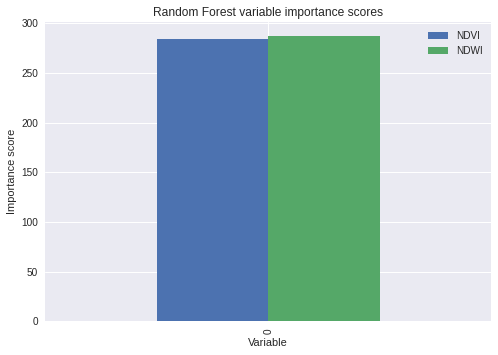

In [0]:

## if export has completed completed. overwrite the samples variable with the assetID.
samples = ee.FeatureCollection(exportFolder + S2exportName)

## train the classifier as before.
S2clf1day = RFclassifier.train(features= samples, 
                               inputProperties= (['NDVI', 'NDWI']),
                               classProperty= 'training')


## What did our classifier learn?
S2_meta = S2clf1day.explain();

## Two of the more useful metrics are the importance and outOfBagErrorEstimate
S2_OOB = round(S2_meta.get('outOfBagErrorEstimate').getInfo(), 3)
print(f'The outOfBagErrorEstimate is {S2_OOB}. This means our classifer is wrong {S2_OOB*100} % of the time \n')

importance =  S2_meta.get('importance').getInfo()
plotImportance(importance)

## you can also view the tree schematics and work out how 
## the model decides wether a pixel is land or water
trees = S2_meta.get('importance')
# pprint(trees)

# 3.3 Coastal analysis: Seperate the data into high or low tide.

First we load some tidal data and reformat the columns names to something more meaningful.

In [0]:
## Load the tidal data and rename the columns to something meaningful.
tideData = ee.FeatureCollection('users/dmdruce/bangladesh/tides_lon91lat22'
                               ).select(['0453162', '20150101'], ['tide', 'date'])

## print some statistics about it.
pprint(tideData.aggregate_stats('tide').getInfo())


{'type': 'DataDictionary',
 'values': {'max': 1.406540036201477,
            'mean': 0.1699419798748426,
            'min': -1.0861330032348633,
            'sample_sd': 0.644862255248537,
            'sample_var': 0.41584732824422926,
            'sum': 682.6569331572427,
            'sum_sq': 1786.0549410248548,
            'total_count': 4017,
            'total_sd': 0.6447819836038309,
            'total_var': 0.4157438063800908,
            'valid_count': 4017,
            'weight_sum': 4017,
            'weighted_sum': 682.6569331572427}}


We can see the maximum tide is +1.4m and the minimum is -1.1m.

The tide data is DHI commercial property, however, we give you permission to keep this for your own use.

Export the tide data to your assets.

In [0]:
## We cannot export features with null geometry direct to asset, so we had a geometry.
def addGeometry (feature):
  geometry = ee.Geometry.Point(91,22)
  return ee.Feature(geometry).copyProperties(feature)

tideData = tideData.map(addGeometry)

In [0]:
TideExportName = f'CTCN_tides_lon91lat22'

### Export to asset
task= ee.batch.Export.table.toAsset(
            collection = tideData,
            description = TideExportName,
            assetId = exportFolder + TideExportName)
task.start()

Join the Sentinel-2 data to the tidal data so that each sentinel-2 image has a corresponding tide value.

In [0]:
### overwrite the coast list with the full time-series
endDate = ee.Date('2020-04-01')   
startDate = ee.Date('2017-01-01') 
stepSize = 1          
cloudfilter = 25

coastList = getDateList(startDate, endDate, stepSize, coastAOI, cloudfilter
                        ).filterMetadata('s2Size', 'greater_than', 0)


## reformat the date field so that it matches the tide data   
def dateToNumber (feature):
  date = ee.Date(feature.get('system:time_start'))
  return feature.set('date', ee.Number.parse(date.format('yMMdd')),
                     'dateMillis', date.millis()).copyProperties(feature)

coastList = ee.FeatureCollection(coastList.map(dateToNumber))



In [0]:
### Join the S2 Dates to the tides by time.
timeFilter = ee.Filter.equals(leftField= 'date', rightField= 'date')
innerJoin = ee.Join.inner()
joined = innerJoin.apply(coastList, tideData, timeFilter)

def concatenateJoin (joinedFeature):
  primary = ee.Feature(joinedFeature.get('primary')).toDictionary()
  secondary = ee.Feature(joinedFeature.get('secondary')).toDictionary()
  return ee.Feature(None, primary.combine(secondary))

## finalise the join, by creating a single feature that contains the timestamp,
## known s2 availability and tide information.
datesAndTide = joined.map(concatenateJoin)
print('total features: ', datesAndTide.size().getInfo())


total features:  126


Now split the feature collection into 'high tide' and 'low tide'

In [0]:
highTideThreshold = 0.6 ##in meters.
lowTideThreshold = -0.5 ##in meters

highTide = datesAndTide.filterMetadata('tide', 'greater_than', highTideThreshold)
print('high tide features: ', highTide.size().getInfo())

lowTide = datesAndTide.filterMetadata('tide', 'less_than', lowTideThreshold)
print('low tide features: ', lowTide.size().getInfo());

pprint(lowTide.first().getInfo())

high tide features:  36
low tide features:  35
{'geometry': None,
 'id': '1_000000000000000002db',
 'properties': {'date': 20170102,
                'dateMillis': 1483315200000,
                'dateNumber': 1,
                's1Size': 0,
                's2Size': 8,
                'tide': -0.6168310046195984},
 'type': 'Feature'}


Last, populate the featureCollection with land-water predictions so that it becomes an imageCollection.

In [0]:
def getS21dayImg(feature):
  start = feature.get('system:time_start') 
  end = feature.get('system:time_end')
  return getS2img(start, end, cloudfilter, coastAOI).copyProperties(feature)

def makeS2Pred (feature):
  start = ee.Date(feature.get('dateMillis'))
  end = start.advance(1, 'day')
  img = getS2img(start, end, cloudfilter, coastAOI)
  return img.classify(S2clf1day).multiply(100).toByte().rename('probability'
                     ).set('system:time_start', start.millis()).copyProperties(feature)


highTidePreds = ee.ImageCollection(highTide.map(makeS2Pred))
lowTidePreds = ee.ImageCollection(lowTide.map(makeS2Pred))


# 3.4 Coastal analysis: Visualise and vectorize the results.

Export a prediction as a raster (tif) file and a vector (geoJSON) file.

In [0]:
## export 1 high tide image as raster and as vector.

htImg = highTidePreds.sort('system:time_start', False).first() ##get the latest.

def thresholdImg (img, threshold):
  return img.gt(threshold).copyProperties(img)

htImg = ee.Image(thresholdImg(htImg, 0.5)) ##threshold to binary product.


Visualise one of the raster results.

In [0]:
htImgID = htImg.getMapId({'min':0, 'max': 1, 'palette':['gray', 'blue'], 'opacity': 0.75})


map = folium.Map(location=[22.2,90.5], zoom_start=9)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = coastAOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.TileLayer(
    tiles=htImgID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='High tide prediction',
  ).add_to(map)

map.add_child(folium.LayerControl())
map

Now create a vector (polygon) of the water.

In [0]:

def vectorize (img):
  dateString = ee.Date(img.get('dateMillis')).format('yMMdd')
  maskedImg = img.updateMask(img.eq(1))
  vector = maskedImg.reduceToVectors(reducer= ee.Reducer.countEvery(), 
                                     geometry= coastAOI,  tileScale= 8,
                                     scale= 10, eightConnected= True, 
                                     labelProperty='water', bestEffort= True)
  filtered = ee.FeatureCollection(vector).filter(ee.Filter.gt('count', 1000)) ##only return large polygons.
  return filtered.map(lambda f: f.set('dateString', dateString))

htVector = vectorize(htImg)



Visualise the vector as well as the raster. Make sure to toggle on and off the layers.

In [0]:

map = folium.Map(location=[22.2,90.5], zoom_start=9)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.GeoJson(
            data = coastAOI.getInfo(),
            name = 'Area of Interest',
            overlay = False,
            control = True
        ).add_to(map)

folium.GeoJson(
            data = htVector.getInfo(),
            name = 'High Tide water vector',
            overlay = True,
            control = True
        ).add_to(map)


folium.TileLayer(
    tiles=htImgID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='High tide prediction',
  ).add_to(map)

map.add_child(folium.LayerControl())
map

Export the vector as a GeoJSON

In [0]:
VectorExportName = f'CTCN_vector_example'

### Export to asset
task= ee.batch.Export.table.toAsset(
            collection = htVector,
            description = VectorExportName,
            assetId = exportFolder + VectorExportName)
task.start()

# 3.4 Coastal analysis: Compute linear regression

We've created predictions and so can compute linear regression on the tidal predictions, like we did before.

In [0]:

### linear regresion
htLR = highTidePreds.map(createTimeBand
                         ).select(['time', 'probability']
                                 ).reduce(ee.Reducer.linearFit())


ltLR = lowTidePreds.map(createTimeBand
                        ).select(['time', 'probability']
                                 ).reduce(ee.Reducer.linearFit())


Visualise the two. What differences can you see? 

If you are interested in the morphology of mudflats it is probably more important to look at the low tide regression. However, if you are interested in the morphology of coastal lands then the high tide regression could be more usefuk.

In [0]:

HTscaleID  = htLR.select('scale').getMapId(slopeStyle)

LTscaleID  = ltLR.select('scale').getMapId(slopeStyle)


map = folium.Map(location=[22.2,90.5], zoom_start=9)
basemaps['Google Maps'].add_to(map)
basemaps['Google Satellite Hybrid'].add_to(map)

folium.TileLayer(
    tiles=HTscaleID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='High tide slope',
  ).add_to(map)

folium.TileLayer(
    tiles=LTscaleID['tile_fetcher'].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name='Low tide slope',
  ).add_to(map)

map.add_child(folium.LayerControl())
map

Export the results

In [0]:
HtLrExportName = 'CTCN_HighTideRegression_v2'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= htLR,
            region= coastAOI,
            scale= 10,
            maxPixels= 10e12,
            description = HtLrExportName,
            assetId = exportFolder + HtLrExportName)
task.start()


In [0]:
LtLrExportName = 'CTCN_LowTideRegression_v2'

### Export to asset
task= ee.batch.Export.image.toAsset(
            image= ltLR,
            region= coastAOI,
            scale= 10,
            maxPixels= 10e12,
            description = LtLrExportName,
            assetId = exportFolder + LtLrExportName)
task.start()

If it is taking too long to load, use this asset we have already computed and then run the visualisation cell above again.

You can change this to your own asset once it's finished exporting.

In [0]:
htLR = ee.Image('users/geo4gras/CTCN/CTCN_HighTideRegression')
ltLR = ee.Image('users/geo4gras/CTCN/CTCN_LowTideRegression')